# Video Day 47 PCA Part 3 

In [2]:
import numpy as np 
import pandas as pd

# Classification Withou PCA 

In [3]:
df = pd.read_csv('Image_train.csv')

In [4]:
df.shape

(42000, 785)

In [5]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
1137,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
import matplotlib.pyplot as plt

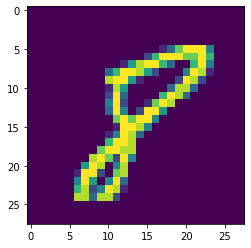

In [8]:
plt.imshow(df.iloc[18306,1:].values.reshape(28,28))

In [9]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [10]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [11]:
X_train.shape

(33600, 784)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

In [13]:
knn = KNeighborsClassifier()

In [14]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [15]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time()-start)

11.489109754562378


In [16]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

# Classification Using PCA 

In [17]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [18]:
# Step-1 (Mean Centring)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [19]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [20]:
X_train_trf =  pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [21]:
X_train_trf.shape

(33600, 200)

In [22]:
knn = KNeighborsClassifier()

In [23]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [24]:
y_predd = knn.predict(X_test_trf)

In [25]:
accuracy_score(y_test,y_predd)

0.9508333333333333

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf =  pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_predd = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_predd))


0.259047619047619
0.3236904761904762
0.5105952380952381
0.6663095238095238
0.7376190476190476
0.8225
0.8428571428571429
0.871547619047619
0.8864285714285715


# In the above cell it is not the complete output as it will take so much of time to execute thus i have stopeed in middle for the further code/Learning For total output i have created the same output in the kaggle go visit that

In [27]:
# transforming whole 728D data to 2D data
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [28]:
X_train_trf

array([[-2.71867801, -0.49047044],
       [-0.67689928, -6.75221049],
       [-3.03329396,  6.50893786],
       ...,
       [ 2.14886282,  0.78102674],
       [ 1.05945054,  0.94624579],
       [17.70248353,  1.96112638]])

In [29]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.show()

In [30]:
# transforming whole 728D data to 3D data
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [31]:
X_train_trf

array([[-2.71864412, -0.49006612,  1.13576359],
       [-0.67699752, -6.75381843, -2.33571115],
       [-3.03321557,  6.50994632,  7.49178763],
       ...,
       [ 2.14882918,  0.78080063, -0.74765974],
       [ 1.05955123,  0.94729634,  3.94998376],
       [17.70254094,  1.96105543, -4.94330201]])

In [32]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df,x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
                   color = y_train_trf)
fig.update_layout(
    margin = dict(l=20,r=20,t=20,b=20)
)
fig.show()

In [33]:
# Step -3
# This is nothing but EIGEN_VALUES
pca.explained_variance_ 

array([40.67111198, 29.1702339 , 26.74459617])

In [34]:
#Eigen Vectors :-
pca.components_

array([[-7.51242720e-18,  1.15192230e-18, -1.48199280e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-6.42142700e-18, -1.57368398e-18,  7.94066700e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-3.70286814e-16,  5.09218208e-17, -1.00696143e-16, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [35]:
# Finding Optimum number of Principal Components

In [36]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [37]:
# Now we will find the optimum number

In [38]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [39]:
pca.explained_variance_

array([4.06711120e+01, 2.91702340e+01, 2.67445962e+01, 2.08534479e+01,
       1.81489188e+01, 1.58529825e+01, 1.38710810e+01, 1.24805897e+01,
       1.10279424e+01, 1.00958253e+01, 9.63317821e+00, 8.62785945e+00,
       8.06303131e+00, 7.89511749e+00, 7.44167929e+00, 7.17032873e+00,
       6.73266373e+00, 6.62744023e+00, 6.41499161e+00, 6.25808269e+00,
       5.90495742e+00, 5.76521585e+00, 5.52084601e+00, 5.32003847e+00,
       5.18309925e+00, 4.93439597e+00, 4.90652171e+00, 4.71800493e+00,
       4.49824444e+00, 4.43140305e+00, 4.32604521e+00, 4.23491831e+00,
       4.10335015e+00, 4.06731180e+00, 4.02362178e+00, 3.84130473e+00,
       3.81886146e+00, 3.71316498e+00, 3.60918108e+00, 3.47303214e+00,
       3.42842989e+00, 3.38841159e+00, 3.29157511e+00, 3.22927379e+00,
       3.21745142e+00, 3.15810372e+00, 3.12620905e+00, 3.10412385e+00,
       3.05892795e+00, 3.03728188e+00, 2.96540461e+00, 2.94033669e+00,
       2.86828564e+00, 2.82617865e+00, 2.80038441e+00, 2.77411221e+00,
      

In [40]:
pca.explained_variance_.shape

(784,)

In [41]:
pca.components_

array([[-1.50074992e-19,  2.77555756e-17, -2.77555756e-16, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-3.77002386e-20, -3.12250226e-17, -6.93889390e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 9.53221129e-20, -2.77555756e-17,  5.55111512e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [-0.00000000e+00,  1.19347432e-01, -7.37910910e-03, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-0.00000000e+00,  5.63738553e-02, -2.08591255e-02, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-0.00000000e+00, -6.78080363e-02, -3.00192066e-02, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [42]:
pca.components_.shape

(784, 784)

In [43]:
np.cumsum(pca.explained_variance_ratio_)# cumsum(consider the row as
#[1,2,3]) now what cumsum will do is give the output of these row as addition of 
#its and previous one 
#i.e 
#[1,3,6]i.e firt 1 then 1+2i.e 3 and then 3+3 i.e 6

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

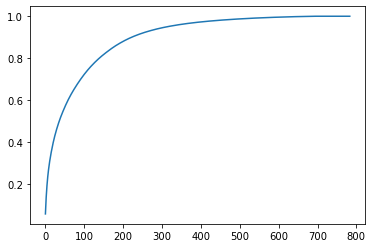

In [44]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))# we can see below that around 200 to 300
#we are achiving the 90 percent of the varience which is the case we should find the 90 percent of the varience
#i.e enough